In [1]:
!pip install opendatasets --upgrade --quiet
import opendatasets as od
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: mohithkgmoni
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time


100%|██████████| 2.29G/2.29G [00:31<00:00, 77.1MB/s]


In [2]:
data_dir = '/content/best-artworks-of-all-time/resized/'
import os
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))
from torchvision.datasets import ImageFolder
dataset = ImageFolder(data_dir)
len(dataset)

resized : 8683


8683

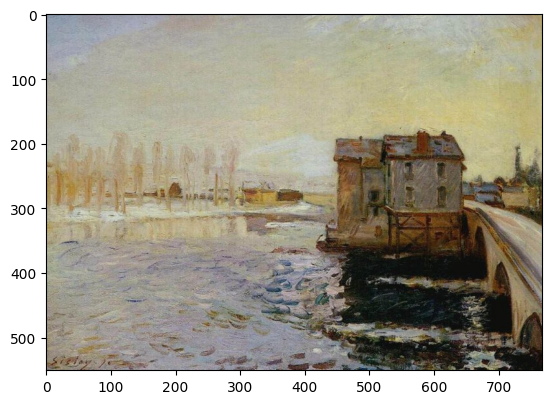

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
img, label = dataset[0]
plt.imshow(img)
img, label = dataset[500]
plt.imshow(img)
img, label = dataset[741]
plt.imshow(img)

In [4]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
train_ds = ImageFolder(data_dir, transform=tt.Compose([
tt.Resize(image_size),
tt.CenterCrop(image_size),
tt.ToTensor(),
tt.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


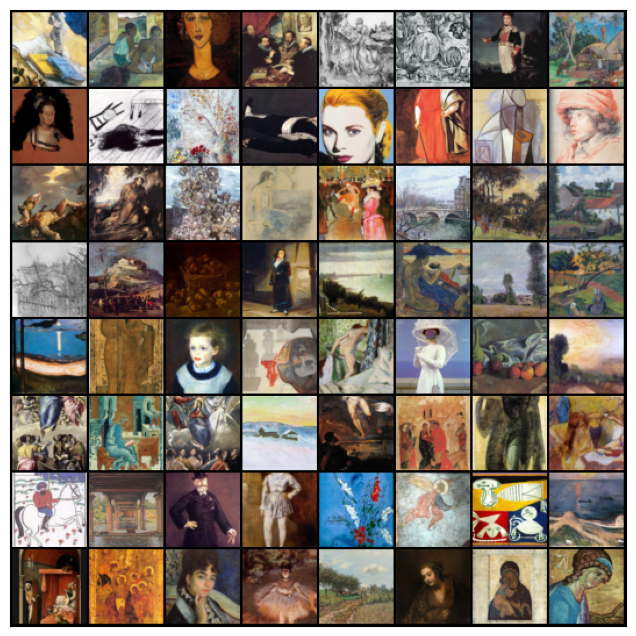

In [5]:
from torchvision.utils import make_grid
def denorm(img_tensors):
  return img_tensors * stats[1][0] + stats[0][0]
def show_images(images, nmax=64):
  fig, ax = plt.subplots(figsize=(8, 8))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
def show_batch(dl, nmax=64):
  for images, _ in dl:
    show_images(images, nmax)
    break
show_batch(train_dl)

# Helper Func

In [6]:
def get_default_device():
  """Pick GPU if available, else CPU"""
  if torch.cuda.is_available():
    return torch.device('cuda')
  else:
    return torch.device('cpu')
def to_device(data, device):
  """Move tensor(s) to chosen device"""
  if isinstance(data, (list,tuple)):
    return [to_device(x, device) for x in data]
  return data.to(device, non_blocking=True)
class DeviceDataLoader():
  """Wrap a dataloader to move data to a device"""
  def __init__(self, dl, device):
    self.dl = dl
    self.device = device
  def __iter__(self):
    """Yield a batch of data after moving it to device"""
    for b in self.dl:
      yield to_device(b, self.device)
  def __len__(self):
    """Number of batches"""
    return len(self.dl)
import torch
device = get_default_device()
device
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network:

In [7]:
import torch.nn as nn
discriminator = nn.Sequential(
# in: 3 x 64 x 64
nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(64),
nn.LeakyReLU(0.2, inplace=True),
# out: 64 x 32 x 32
nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(128),
nn.LeakyReLU(0.2, inplace=True),
# out: 128 x 16 x 16
nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(256),
nn.LeakyReLU(0.2, inplace=True),
# out: 256 x 8 x 8
nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(512),
nn.LeakyReLU(0.2, inplace=True),
# out: 512 x 4 x 4
nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
# out: 1 x 1 x 1
nn.Flatten(),
nn.Sigmoid())
discriminator = to_device(discriminator, device)

# Generator Network:

In [8]:
latent_size = 128
generator = nn.Sequential(
# in: latent_size x 1 x 1
nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
nn.BatchNorm2d(512),
nn.ReLU(True),
# out: 512 x 4 x 4
nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(256),
nn.ReLU(True),
# out: 256 x 8 x 8
nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(128),
nn.ReLU(True),
# out: 128 x 16 x 16
nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
nn.BatchNorm2d(64),
nn.ReLU(True),
# out: 64 x 32 x 32
nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
nn.Tanh()
# out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


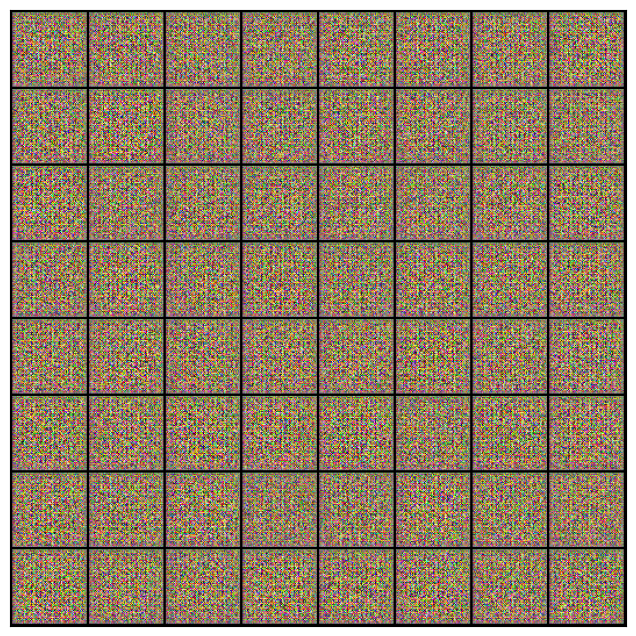

In [9]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [10]:
def train_discriminator(real_images, opt_d):
  # Clear discriminator gradients
  opt_d.zero_grad()
  # Pass real images through discriminator
  real_preds = discriminator(real_images)
  real_targets = torch.ones(real_images.size(0), 1, device=device)
  real_loss = F.binary_cross_entropy(real_preds, real_targets)
  real_score = torch.mean(real_preds).item()
  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
  fake_images = generator(latent)
  # Pass fake images through discriminator
  fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
  fake_preds = discriminator(fake_images)
  fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()
  # Update discriminator weights
  loss = real_loss + fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(), real_score, fake_score


In [11]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()


Saving generated-images-0000.png


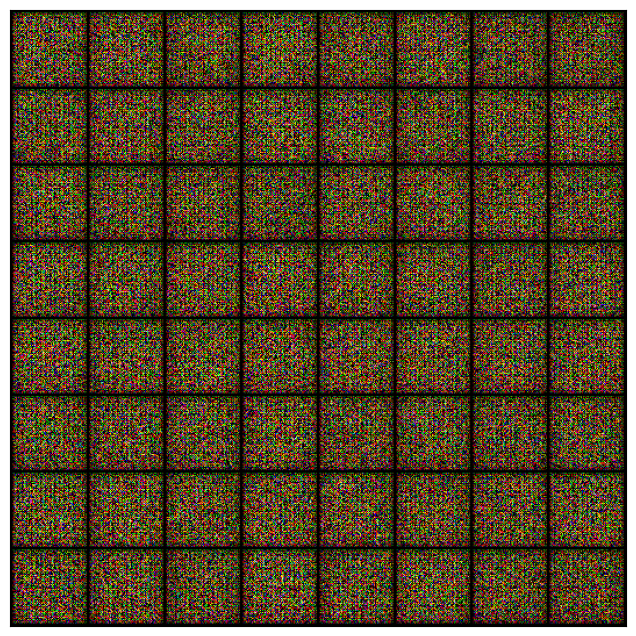

In [12]:
import torch
import os
from torchvision.utils import save_image

sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

def save_samples(index, latent_tensors, generator, show=True, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    generator.to(device)  # Move generator to the device
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(fake_images, os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
save_samples(0, fixed_latent, generator)

# Training Loop

In [13]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)

            # Train generator
            loss_g = train_generator(opt_g)

            # Record losses & scores
            losses_g.append(loss_g)
            losses_d.append(loss_d)
            real_scores.append(real_score)
            fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, generator, show=False)

    return losses_g, losses_d, real_scores, fake_scores

lr = 0.0002
epochs = 300
history = fit(epochs, lr)
losses_g, losses_d, real_scores, fake_scores = history

# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [1/300], loss_g: 5.6211, loss_d: 0.3491, real_score: 0.9112, fake_score: 0.2165
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/300], loss_g: 2.7376, loss_d: 0.4470, real_score: 0.7492, fake_score: 0.1291
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/300], loss_g: 1.9506, loss_d: 0.7222, real_score: 0.6099, fake_score: 0.1447
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/300], loss_g: 4.6655, loss_d: 0.9245, real_score: 0.8220, fake_score: 0.4839
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/300], loss_g: 1.4584, loss_d: 0.3118, real_score: 0.8519, fake_score: 0.1199
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/300], loss_g: 6.6677, loss_d: 0.1682, real_score: 0.8705, fake_score: 0.0065
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/300], loss_g: 7.8123, loss_d: 0.6072, real_score: 0.6169, fake_score: 0.0024
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/300], loss_g: 1.8961, loss_d: 0.7675, real_score: 0.6008, fake_score: 0.1430
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/300], loss_g: 3.4037, loss_d: 0.3470, real_score: 0.7945, fake_score: 0.0918
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/300], loss_g: 2.4585, loss_d: 0.4426, real_score: 0.8919, fake_score: 0.2479
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/300], loss_g: 3.1925, loss_d: 0.4395, real_score: 0.8434, fake_score: 0.2094
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/300], loss_g: 4.4548, loss_d: 1.0153, real_score: 0.4519, fake_score: 0.0036
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/300], loss_g: 6.5526, loss_d: 0.5706, real_score: 0.9511, fake_score: 0.3740
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/300], loss_g: 5.0906, loss_d: 0.4844, real_score: 0.8903, fake_score: 0.2893
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/300], loss_g: 2.5179, loss_d: 0.4625, real_score: 0.8280, fake_score: 0.1926
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/300], loss_g: 2.8459, loss_d: 1.0598, real_score: 0.4396, fake_score: 0.0114
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/300], loss_g: 3.4868, loss_d: 0.4522, real_score: 0.8750, fake_score: 0.2382
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/300], loss_g: 2.2979, loss_d: 1.7475, real_score: 0.2817, fake_score: 0.0187
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/300], loss_g: 3.6792, loss_d: 0.6909, real_score: 0.7241, fake_score: 0.2456
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/300], loss_g: 1.2983, loss_d: 0.8042, real_score: 0.5450, fake_score: 0.0710
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/300], loss_g: 3.9998, loss_d: 0.7612, real_score: 0.5344, fake_score: 0.0151
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/300], loss_g: 2.1440, loss_d: 0.2724, real_score: 0.8770, fake_score: 0.1087
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/300], loss_g: 3.3651, loss_d: 0.4497, real_score: 0.7122, fake_score: 0.0648
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/300], loss_g: 3.1604, loss_d: 1.0922, real_score: 0.5718, fake_score: 0.3299
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/300], loss_g: 3.5043, loss_d: 0.3320, real_score: 0.7817, fake_score: 0.0621
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/300], loss_g: 2.3390, loss_d: 0.2954, real_score: 0.8818, fake_score: 0.1266
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/300], loss_g: 3.5021, loss_d: 0.4524, real_score: 0.7465, fake_score: 0.0985
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/300], loss_g: 4.0468, loss_d: 0.5191, real_score: 0.8398, fake_score: 0.2683
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/300], loss_g: 4.0200, loss_d: 0.4472, real_score: 0.8750, fake_score: 0.2464
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/300], loss_g: 1.3759, loss_d: 1.4030, real_score: 0.3343, fake_score: 0.0031
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/300], loss_g: 1.6300, loss_d: 1.0043, real_score: 0.4173, fake_score: 0.0035
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/300], loss_g: 3.5148, loss_d: 0.3890, real_score: 0.7869, fake_score: 0.0979
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/300], loss_g: 2.6327, loss_d: 0.1604, real_score: 0.9213, fake_score: 0.0710
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/300], loss_g: 8.1338, loss_d: 1.5669, real_score: 0.9547, fake_score: 0.7047
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/300], loss_g: 2.7020, loss_d: 0.3712, real_score: 0.7738, fake_score: 0.0853
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/300], loss_g: 1.1086, loss_d: 1.4329, real_score: 0.3219, fake_score: 0.0135
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/300], loss_g: 3.0008, loss_d: 0.3640, real_score: 0.8574, fake_score: 0.1679
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/300], loss_g: 4.5758, loss_d: 0.3398, real_score: 0.8176, fake_score: 0.1044
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/300], loss_g: 4.3562, loss_d: 0.4474, real_score: 0.9737, fake_score: 0.3044
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/300], loss_g: 4.3972, loss_d: 0.6012, real_score: 0.9487, fake_score: 0.3555
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/300], loss_g: 7.0614, loss_d: 0.8028, real_score: 0.9827, fake_score: 0.4970
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/300], loss_g: 3.8064, loss_d: 0.3369, real_score: 0.8615, fake_score: 0.1552
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/300], loss_g: 3.4648, loss_d: 0.3661, real_score: 0.7961, fake_score: 0.0895
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/300], loss_g: 2.6514, loss_d: 0.3212, real_score: 0.9543, fake_score: 0.2132
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/300], loss_g: 3.2367, loss_d: 0.2753, real_score: 0.8331, fake_score: 0.0613
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/300], loss_g: 3.0229, loss_d: 3.0118, real_score: 0.0830, fake_score: 0.0003
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/300], loss_g: 4.1014, loss_d: 0.4038, real_score: 0.9213, fake_score: 0.2590
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/300], loss_g: 4.8842, loss_d: 0.5616, real_score: 0.9115, fake_score: 0.3423
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/300], loss_g: 3.5369, loss_d: 0.2797, real_score: 0.9551, fake_score: 0.1821
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/300], loss_g: 4.2023, loss_d: 0.3025, real_score: 0.9107, fake_score: 0.1727
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/300], loss_g: 3.7145, loss_d: 0.1952, real_score: 0.9468, fake_score: 0.1185
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/300], loss_g: 8.6239, loss_d: 1.0892, real_score: 0.9793, fake_score: 0.5860
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/300], loss_g: 3.1017, loss_d: 0.4964, real_score: 0.6825, fake_score: 0.0208
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/300], loss_g: 4.0780, loss_d: 0.2434, real_score: 0.9518, fake_score: 0.1641
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/300], loss_g: 4.8322, loss_d: 0.3855, real_score: 0.9765, fake_score: 0.2759
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/300], loss_g: 5.5117, loss_d: 0.7766, real_score: 0.9910, fake_score: 0.4764
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/300], loss_g: 4.7207, loss_d: 0.4204, real_score: 0.9726, fake_score: 0.2718
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/300], loss_g: 4.3967, loss_d: 0.1735, real_score: 0.8960, fake_score: 0.0535
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/300], loss_g: 5.9889, loss_d: 0.0889, real_score: 0.9394, fake_score: 0.0239
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/300], loss_g: 1.3088, loss_d: 0.4517, real_score: 0.7612, fake_score: 0.1202
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/300], loss_g: 7.3164, loss_d: 0.5497, real_score: 0.9935, fake_score: 0.3745
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/300], loss_g: 3.1700, loss_d: 0.2942, real_score: 0.7952, fake_score: 0.0452
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/300], loss_g: 4.7193, loss_d: 0.1787, real_score: 0.9517, fake_score: 0.1123
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/300], loss_g: 3.9683, loss_d: 0.1613, real_score: 0.9362, fake_score: 0.0815
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/300], loss_g: 3.3458, loss_d: 0.3370, real_score: 0.8728, fake_score: 0.1619
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/300], loss_g: 4.0021, loss_d: 0.3275, real_score: 0.9544, fake_score: 0.2203
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/300], loss_g: 6.0609, loss_d: 0.6428, real_score: 0.9300, fake_score: 0.3909
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/300], loss_g: 3.4287, loss_d: 0.5051, real_score: 0.6659, fake_score: 0.0287
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/300], loss_g: 3.1817, loss_d: 0.2185, real_score: 0.9731, fake_score: 0.1625
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/300], loss_g: 3.2685, loss_d: 0.3493, real_score: 0.9547, fake_score: 0.2425
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/300], loss_g: 3.6804, loss_d: 0.1647, real_score: 0.8719, fake_score: 0.0202
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/300], loss_g: 4.6494, loss_d: 0.1179, real_score: 0.9594, fake_score: 0.0704
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/300], loss_g: 8.1568, loss_d: 1.3774, real_score: 0.9925, fake_score: 0.6444
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/300], loss_g: 4.7499, loss_d: 0.3707, real_score: 0.9213, fake_score: 0.2185
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/300], loss_g: 5.9201, loss_d: 0.9961, real_score: 0.9936, fake_score: 0.5573
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/300], loss_g: 4.3980, loss_d: 0.5891, real_score: 0.9703, fake_score: 0.3904
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/300], loss_g: 3.6717, loss_d: 0.3123, real_score: 0.8644, fake_score: 0.1313
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/300], loss_g: 2.6168, loss_d: 0.3247, real_score: 0.7746, fake_score: 0.0422
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/300], loss_g: 2.3883, loss_d: 0.4804, real_score: 0.6894, fake_score: 0.0613
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/300], loss_g: 4.3076, loss_d: 0.3607, real_score: 0.9359, fake_score: 0.2312
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/300], loss_g: 8.4648, loss_d: 1.8834, real_score: 0.9974, fake_score: 0.7647
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/300], loss_g: 2.2380, loss_d: 0.5015, real_score: 0.7126, fake_score: 0.0777
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/300], loss_g: 4.4858, loss_d: 0.1979, real_score: 0.8745, fake_score: 0.0457
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/300], loss_g: 4.4880, loss_d: 0.4161, real_score: 0.9414, fake_score: 0.2762
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/300], loss_g: 4.4628, loss_d: 0.1204, real_score: 0.9328, fake_score: 0.0448
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/300], loss_g: 4.8925, loss_d: 0.2272, real_score: 0.9854, fake_score: 0.1796
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/300], loss_g: 5.4351, loss_d: 1.2434, real_score: 0.9897, fake_score: 0.5964
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/300], loss_g: 3.7816, loss_d: 0.1954, real_score: 0.9384, fake_score: 0.1126
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/300], loss_g: 4.1588, loss_d: 0.5670, real_score: 0.9929, fake_score: 0.3824
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/300], loss_g: 4.9836, loss_d: 0.4160, real_score: 0.9785, fake_score: 0.2950
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/300], loss_g: 5.5303, loss_d: 0.3341, real_score: 0.9439, fake_score: 0.2181
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/300], loss_g: 4.9240, loss_d: 0.4700, real_score: 0.9731, fake_score: 0.3210
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/300], loss_g: 1.6164, loss_d: 0.3535, real_score: 0.7651, fake_score: 0.0500
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/300], loss_g: 3.0403, loss_d: 0.5526, real_score: 0.6472, fake_score: 0.0247
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/300], loss_g: 3.2478, loss_d: 0.7451, real_score: 0.7845, fake_score: 0.3255
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/300], loss_g: 3.2940, loss_d: 0.2006, real_score: 0.8516, fake_score: 0.0281
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/300], loss_g: 3.7630, loss_d: 0.1079, real_score: 0.9977, fake_score: 0.0943
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/300], loss_g: 4.5715, loss_d: 0.1582, real_score: 0.9546, fake_score: 0.0990
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/300], loss_g: 2.5120, loss_d: 0.3440, real_score: 0.7681, fake_score: 0.0267
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/300], loss_g: 5.3106, loss_d: 0.0767, real_score: 0.9633, fake_score: 0.0369
Saving generated-images-0100.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [101/300], loss_g: 1.6288, loss_d: 0.4264, real_score: 0.7795, fake_score: 0.1188
Saving generated-images-0101.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [102/300], loss_g: 3.1011, loss_d: 0.2845, real_score: 0.8787, fake_score: 0.1265
Saving generated-images-0102.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [103/300], loss_g: 3.3340, loss_d: 0.1852, real_score: 0.8571, fake_score: 0.0204
Saving generated-images-0103.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [104/300], loss_g: 3.3205, loss_d: 0.2076, real_score: 0.8668, fake_score: 0.0522
Saving generated-images-0104.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [105/300], loss_g: 4.6698, loss_d: 0.1060, real_score: 0.9834, fake_score: 0.0819
Saving generated-images-0105.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [106/300], loss_g: 4.4909, loss_d: 0.1856, real_score: 0.9092, fake_score: 0.0771
Saving generated-images-0106.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [107/300], loss_g: 6.0168, loss_d: 0.9094, real_score: 0.9309, fake_score: 0.5119
Saving generated-images-0107.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [108/300], loss_g: 2.4847, loss_d: 0.5043, real_score: 0.6836, fake_score: 0.0475
Saving generated-images-0108.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [109/300], loss_g: 3.3527, loss_d: 0.1922, real_score: 0.8815, fake_score: 0.0537
Saving generated-images-0109.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [110/300], loss_g: 4.2126, loss_d: 0.4483, real_score: 0.9951, fake_score: 0.3096
Saving generated-images-0110.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [111/300], loss_g: 1.3935, loss_d: 0.4765, real_score: 0.6793, fake_score: 0.0378
Saving generated-images-0111.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [112/300], loss_g: 3.2126, loss_d: 0.2825, real_score: 0.8701, fake_score: 0.1176
Saving generated-images-0112.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [113/300], loss_g: 3.1268, loss_d: 0.1993, real_score: 0.9211, fake_score: 0.0985
Saving generated-images-0113.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [114/300], loss_g: 3.2470, loss_d: 0.2666, real_score: 0.9897, fake_score: 0.2055
Saving generated-images-0114.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [115/300], loss_g: 4.2569, loss_d: 0.1579, real_score: 0.9913, fake_score: 0.1154
Saving generated-images-0115.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [116/300], loss_g: 2.8298, loss_d: 0.4544, real_score: 0.8371, fake_score: 0.2030
Saving generated-images-0116.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [117/300], loss_g: 4.8265, loss_d: 0.1368, real_score: 0.9675, fake_score: 0.0926
Saving generated-images-0117.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [118/300], loss_g: 4.0222, loss_d: 0.1336, real_score: 0.9759, fake_score: 0.0968
Saving generated-images-0118.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [119/300], loss_g: 3.8170, loss_d: 0.0825, real_score: 0.9661, fake_score: 0.0431
Saving generated-images-0119.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [120/300], loss_g: 1.9574, loss_d: 0.3188, real_score: 0.7628, fake_score: 0.0226
Saving generated-images-0120.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [121/300], loss_g: 2.8669, loss_d: 0.1896, real_score: 0.8596, fake_score: 0.0205
Saving generated-images-0121.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [122/300], loss_g: 3.8811, loss_d: 0.1391, real_score: 0.9478, fake_score: 0.0767
Saving generated-images-0122.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [123/300], loss_g: 5.2176, loss_d: 0.0788, real_score: 0.9821, fake_score: 0.0567
Saving generated-images-0123.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [124/300], loss_g: 2.7622, loss_d: 0.1486, real_score: 0.9254, fake_score: 0.0579
Saving generated-images-0124.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [125/300], loss_g: 4.1135, loss_d: 0.0895, real_score: 0.9860, fake_score: 0.0695
Saving generated-images-0125.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [126/300], loss_g: 1.4749, loss_d: 0.4680, real_score: 0.6722, fake_score: 0.0130
Saving generated-images-0126.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [127/300], loss_g: 5.0253, loss_d: 0.0849, real_score: 0.9464, fake_score: 0.0261
Saving generated-images-0127.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [128/300], loss_g: 3.9036, loss_d: 0.9235, real_score: 0.9764, fake_score: 0.4418
Saving generated-images-0128.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [129/300], loss_g: 3.5189, loss_d: 0.3031, real_score: 0.8944, fake_score: 0.1518
Saving generated-images-0129.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [130/300], loss_g: 3.7911, loss_d: 0.1200, real_score: 0.9739, fake_score: 0.0827
Saving generated-images-0130.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [131/300], loss_g: 3.7743, loss_d: 0.3404, real_score: 0.7489, fake_score: 0.0096
Saving generated-images-0131.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [132/300], loss_g: 3.6504, loss_d: 0.3245, real_score: 0.9817, fake_score: 0.2320
Saving generated-images-0132.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [133/300], loss_g: 2.8314, loss_d: 0.1257, real_score: 0.9902, fake_score: 0.1038
Saving generated-images-0133.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [134/300], loss_g: 4.2929, loss_d: 0.1011, real_score: 0.9144, fake_score: 0.0084
Saving generated-images-0134.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [135/300], loss_g: 3.6973, loss_d: 0.0800, real_score: 0.9719, fake_score: 0.0475
Saving generated-images-0135.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [136/300], loss_g: 3.9193, loss_d: 0.2627, real_score: 0.9810, fake_score: 0.1943
Saving generated-images-0136.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [137/300], loss_g: 5.2661, loss_d: 0.5996, real_score: 0.9920, fake_score: 0.3630
Saving generated-images-0137.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [138/300], loss_g: 3.1819, loss_d: 0.2327, real_score: 0.8498, fake_score: 0.0505
Saving generated-images-0138.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [139/300], loss_g: 4.0711, loss_d: 0.1317, real_score: 0.9496, fake_score: 0.0696
Saving generated-images-0139.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [140/300], loss_g: 3.4767, loss_d: 0.1652, real_score: 0.8683, fake_score: 0.0144
Saving generated-images-0140.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [141/300], loss_g: 4.8295, loss_d: 0.1762, real_score: 0.9566, fake_score: 0.1148
Saving generated-images-0141.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [142/300], loss_g: 3.9874, loss_d: 0.1208, real_score: 0.9201, fake_score: 0.0328
Saving generated-images-0142.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [143/300], loss_g: 1.5215, loss_d: 1.2607, real_score: 0.5179, fake_score: 0.2330
Saving generated-images-0143.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [144/300], loss_g: 3.7139, loss_d: 0.4248, real_score: 0.9445, fake_score: 0.2667
Saving generated-images-0144.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [145/300], loss_g: 3.3111, loss_d: 0.1768, real_score: 0.9229, fake_score: 0.0839
Saving generated-images-0145.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [146/300], loss_g: 3.6611, loss_d: 0.1324, real_score: 0.9378, fake_score: 0.0615
Saving generated-images-0146.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [147/300], loss_g: 4.3161, loss_d: 0.1499, real_score: 0.9194, fake_score: 0.0577
Saving generated-images-0147.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [148/300], loss_g: 5.0894, loss_d: 0.0946, real_score: 0.9339, fake_score: 0.0236
Saving generated-images-0148.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [149/300], loss_g: 3.8955, loss_d: 0.1855, real_score: 0.9183, fake_score: 0.0867
Saving generated-images-0149.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [150/300], loss_g: 4.2147, loss_d: 0.0525, real_score: 0.9738, fake_score: 0.0249
Saving generated-images-0150.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [151/300], loss_g: 5.6694, loss_d: 0.1020, real_score: 0.9241, fake_score: 0.0196
Saving generated-images-0151.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [152/300], loss_g: 2.5293, loss_d: 0.2938, real_score: 0.8058, fake_score: 0.0485
Saving generated-images-0152.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [153/300], loss_g: 3.9152, loss_d: 0.0613, real_score: 0.9789, fake_score: 0.0375
Saving generated-images-0153.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [154/300], loss_g: 2.8743, loss_d: 0.2592, real_score: 0.8005, fake_score: 0.0233
Saving generated-images-0154.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [155/300], loss_g: 3.1237, loss_d: 0.1544, real_score: 0.8851, fake_score: 0.0256
Saving generated-images-0155.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [156/300], loss_g: 3.9075, loss_d: 0.0676, real_score: 0.9591, fake_score: 0.0243
Saving generated-images-0156.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [157/300], loss_g: 13.9857, loss_d: 3.9147, real_score: 0.9961, fake_score: 0.9128
Saving generated-images-0157.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [158/300], loss_g: 3.8521, loss_d: 1.3010, real_score: 0.8315, fake_score: 0.5515
Saving generated-images-0158.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [159/300], loss_g: 5.1210, loss_d: 0.6497, real_score: 0.8937, fake_score: 0.3398
Saving generated-images-0159.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [160/300], loss_g: 3.9038, loss_d: 0.0869, real_score: 0.9649, fake_score: 0.0464
Saving generated-images-0160.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [161/300], loss_g: 3.5205, loss_d: 0.1955, real_score: 0.8882, fake_score: 0.0638
Saving generated-images-0161.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [162/300], loss_g: 4.0272, loss_d: 0.1028, real_score: 0.9645, fake_score: 0.0610
Saving generated-images-0162.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [163/300], loss_g: 1.9632, loss_d: 0.3366, real_score: 0.7587, fake_score: 0.0309
Saving generated-images-0163.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [164/300], loss_g: 4.9132, loss_d: 0.3499, real_score: 0.9976, fake_score: 0.2606
Saving generated-images-0164.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [165/300], loss_g: 3.9403, loss_d: 0.1178, real_score: 0.9988, fake_score: 0.1049
Saving generated-images-0165.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [166/300], loss_g: 8.4268, loss_d: 4.6470, real_score: 0.9998, fake_score: 0.9712
Saving generated-images-0166.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [167/300], loss_g: 4.3071, loss_d: 0.1941, real_score: 0.9119, fake_score: 0.0800
Saving generated-images-0167.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [168/300], loss_g: 4.4101, loss_d: 0.0481, real_score: 0.9800, fake_score: 0.0265
Saving generated-images-0168.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [169/300], loss_g: 5.4786, loss_d: 0.0241, real_score: 0.9948, fake_score: 0.0184
Saving generated-images-0169.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [170/300], loss_g: 4.9550, loss_d: 0.4582, real_score: 0.9894, fake_score: 0.3117
Saving generated-images-0170.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [171/300], loss_g: 4.3394, loss_d: 0.0678, real_score: 0.9895, fake_score: 0.0519
Saving generated-images-0171.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [172/300], loss_g: 5.0190, loss_d: 0.1393, real_score: 0.9553, fake_score: 0.0833
Saving generated-images-0172.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [173/300], loss_g: 4.2902, loss_d: 0.0648, real_score: 0.9965, fake_score: 0.0573
Saving generated-images-0173.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [174/300], loss_g: 4.5620, loss_d: 0.1145, real_score: 0.9938, fake_score: 0.0931
Saving generated-images-0174.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [175/300], loss_g: 1.8590, loss_d: 0.5276, real_score: 0.6817, fake_score: 0.0356
Saving generated-images-0175.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [176/300], loss_g: 3.8110, loss_d: 0.1533, real_score: 0.8945, fake_score: 0.0312
Saving generated-images-0176.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [177/300], loss_g: 4.0445, loss_d: 0.1007, real_score: 0.9462, fake_score: 0.0401
Saving generated-images-0177.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [178/300], loss_g: 5.4977, loss_d: 0.0589, real_score: 0.9730, fake_score: 0.0300
Saving generated-images-0178.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [179/300], loss_g: 5.6083, loss_d: 0.0470, real_score: 0.9647, fake_score: 0.0101
Saving generated-images-0179.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [180/300], loss_g: 5.4484, loss_d: 0.0476, real_score: 0.9891, fake_score: 0.0349
Saving generated-images-0180.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [181/300], loss_g: 5.0770, loss_d: 0.1128, real_score: 0.9927, fake_score: 0.0909
Saving generated-images-0181.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [182/300], loss_g: 5.7732, loss_d: 0.0173, real_score: 0.9961, fake_score: 0.0131
Saving generated-images-0182.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [183/300], loss_g: 3.4712, loss_d: 0.1259, real_score: 0.9979, fake_score: 0.1080
Saving generated-images-0183.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [184/300], loss_g: 1.4823, loss_d: 1.3456, real_score: 0.6000, fake_score: 0.3748
Saving generated-images-0184.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [185/300], loss_g: 2.0788, loss_d: 0.7882, real_score: 0.6836, fake_score: 0.1887
Saving generated-images-0185.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [186/300], loss_g: 2.5626, loss_d: 0.4326, real_score: 0.7382, fake_score: 0.0499
Saving generated-images-0186.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [187/300], loss_g: 4.2275, loss_d: 0.1538, real_score: 0.8909, fake_score: 0.0267
Saving generated-images-0187.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [188/300], loss_g: 4.6228, loss_d: 0.1120, real_score: 0.9263, fake_score: 0.0303
Saving generated-images-0188.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [189/300], loss_g: 4.8646, loss_d: 0.1178, real_score: 0.9918, fake_score: 0.0989
Saving generated-images-0189.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [190/300], loss_g: 6.6919, loss_d: 0.0214, real_score: 0.9924, fake_score: 0.0135
Saving generated-images-0190.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [191/300], loss_g: 4.2447, loss_d: 0.1962, real_score: 0.8364, fake_score: 0.0042
Saving generated-images-0191.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [192/300], loss_g: 3.2569, loss_d: 0.1465, real_score: 0.8933, fake_score: 0.0274
Saving generated-images-0192.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [193/300], loss_g: 4.8961, loss_d: 0.1067, real_score: 0.9171, fake_score: 0.0166
Saving generated-images-0193.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [194/300], loss_g: 2.6141, loss_d: 0.5575, real_score: 0.7533, fake_score: 0.1010
Saving generated-images-0194.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [195/300], loss_g: 3.4398, loss_d: 0.1799, real_score: 0.8670, fake_score: 0.0251
Saving generated-images-0195.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [196/300], loss_g: 4.5990, loss_d: 0.0509, real_score: 0.9765, fake_score: 0.0257
Saving generated-images-0196.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [197/300], loss_g: 4.4461, loss_d: 0.0638, real_score: 0.9964, fake_score: 0.0553
Saving generated-images-0197.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [198/300], loss_g: 3.9434, loss_d: 0.0493, real_score: 0.9973, fake_score: 0.0428
Saving generated-images-0198.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [199/300], loss_g: 5.4581, loss_d: 0.0456, real_score: 0.9946, fake_score: 0.0382
Saving generated-images-0199.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [200/300], loss_g: 5.1110, loss_d: 0.0329, real_score: 0.9829, fake_score: 0.0152
Saving generated-images-0200.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [201/300], loss_g: 4.9518, loss_d: 0.0680, real_score: 0.9898, fake_score: 0.0535
Saving generated-images-0201.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [202/300], loss_g: 5.4759, loss_d: 0.0221, real_score: 0.9910, fake_score: 0.0129
Saving generated-images-0202.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [203/300], loss_g: 5.7171, loss_d: 0.0590, real_score: 0.9508, fake_score: 0.0069
Saving generated-images-0203.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [204/300], loss_g: 8.9107, loss_d: 9.5624, real_score: 0.9999, fake_score: 0.9881
Saving generated-images-0204.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [205/300], loss_g: 6.8361, loss_d: 0.6110, real_score: 0.9811, fake_score: 0.3624
Saving generated-images-0205.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [206/300], loss_g: 2.7268, loss_d: 0.2908, real_score: 0.8484, fake_score: 0.0565
Saving generated-images-0206.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [207/300], loss_g: 4.0861, loss_d: 0.2665, real_score: 0.9907, fake_score: 0.2032
Saving generated-images-0207.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [208/300], loss_g: 3.6868, loss_d: 0.1655, real_score: 0.8729, fake_score: 0.0216
Saving generated-images-0208.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [209/300], loss_g: 3.6934, loss_d: 0.0953, real_score: 0.9590, fake_score: 0.0487
Saving generated-images-0209.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [210/300], loss_g: 4.6174, loss_d: 0.0483, real_score: 0.9927, fake_score: 0.0390
Saving generated-images-0210.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [211/300], loss_g: 4.3913, loss_d: 0.0337, real_score: 0.9803, fake_score: 0.0134
Saving generated-images-0211.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [212/300], loss_g: 5.1427, loss_d: 0.0545, real_score: 0.9931, fake_score: 0.0448
Saving generated-images-0212.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [213/300], loss_g: 4.1940, loss_d: 0.0358, real_score: 0.9914, fake_score: 0.0265
Saving generated-images-0213.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [214/300], loss_g: 5.4208, loss_d: 0.0548, real_score: 0.9575, fake_score: 0.0102
Saving generated-images-0214.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [215/300], loss_g: 4.5899, loss_d: 0.0246, real_score: 0.9873, fake_score: 0.0115
Saving generated-images-0215.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [216/300], loss_g: 5.1851, loss_d: 0.0505, real_score: 0.9597, fake_score: 0.0085
Saving generated-images-0216.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [217/300], loss_g: 5.9691, loss_d: 0.0271, real_score: 0.9942, fake_score: 0.0207
Saving generated-images-0217.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [218/300], loss_g: 4.6184, loss_d: 0.0786, real_score: 0.9659, fake_score: 0.0399
Saving generated-images-0218.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [219/300], loss_g: 5.7798, loss_d: 0.0274, real_score: 0.9790, fake_score: 0.0060
Saving generated-images-0219.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [220/300], loss_g: 3.5507, loss_d: 0.7602, real_score: 0.7907, fake_score: 0.2882
Saving generated-images-0220.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [221/300], loss_g: 5.2815, loss_d: 0.5199, real_score: 0.9032, fake_score: 0.2758
Saving generated-images-0221.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [222/300], loss_g: 5.1013, loss_d: 0.0924, real_score: 0.9297, fake_score: 0.0147
Saving generated-images-0222.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [223/300], loss_g: 4.9514, loss_d: 0.1004, real_score: 0.9589, fake_score: 0.0527
Saving generated-images-0223.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [224/300], loss_g: 2.4654, loss_d: 0.2189, real_score: 0.8458, fake_score: 0.0342
Saving generated-images-0224.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [225/300], loss_g: 3.1722, loss_d: 0.1890, real_score: 0.9367, fake_score: 0.1062
Saving generated-images-0225.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [226/300], loss_g: 5.0469, loss_d: 0.0688, real_score: 0.9739, fake_score: 0.0394
Saving generated-images-0226.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [227/300], loss_g: 4.8429, loss_d: 0.0769, real_score: 0.9418, fake_score: 0.0140
Saving generated-images-0227.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [228/300], loss_g: 3.8719, loss_d: 0.0580, real_score: 0.9610, fake_score: 0.0168
Saving generated-images-0228.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [229/300], loss_g: 5.2981, loss_d: 0.0442, real_score: 0.9933, fake_score: 0.0353
Saving generated-images-0229.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [230/300], loss_g: 5.7242, loss_d: 0.0614, real_score: 0.9973, fake_score: 0.0537
Saving generated-images-0230.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [231/300], loss_g: 5.1702, loss_d: 0.0292, real_score: 0.9865, fake_score: 0.0152
Saving generated-images-0231.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [232/300], loss_g: 5.4980, loss_d: 0.0544, real_score: 0.9592, fake_score: 0.0095
Saving generated-images-0232.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [233/300], loss_g: 2.8362, loss_d: 0.2641, real_score: 0.8019, fake_score: 0.0027
Saving generated-images-0233.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [234/300], loss_g: 1.0623, loss_d: 0.2547, real_score: 0.7978, fake_score: 0.0111
Saving generated-images-0234.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [235/300], loss_g: 4.1753, loss_d: 0.4417, real_score: 0.7684, fake_score: 0.0791
Saving generated-images-0235.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [236/300], loss_g: 3.7316, loss_d: 0.1201, real_score: 0.9834, fake_score: 0.0878
Saving generated-images-0236.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [237/300], loss_g: 5.2320, loss_d: 0.0890, real_score: 0.9835, fake_score: 0.0661
Saving generated-images-0237.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [238/300], loss_g: 4.9111, loss_d: 0.0328, real_score: 0.9966, fake_score: 0.0283
Saving generated-images-0238.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [239/300], loss_g: 4.2953, loss_d: 0.0570, real_score: 0.9976, fake_score: 0.0521
Saving generated-images-0239.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [240/300], loss_g: 3.8875, loss_d: 0.0555, real_score: 0.9686, fake_score: 0.0223
Saving generated-images-0240.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [241/300], loss_g: 5.8212, loss_d: 0.0227, real_score: 0.9843, fake_score: 0.0067
Saving generated-images-0241.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [242/300], loss_g: 5.5237, loss_d: 0.0484, real_score: 0.9903, fake_score: 0.0371
Saving generated-images-0242.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [243/300], loss_g: 5.7586, loss_d: 0.0313, real_score: 0.9784, fake_score: 0.0088
Saving generated-images-0243.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [244/300], loss_g: 5.6931, loss_d: 0.0174, real_score: 0.9951, fake_score: 0.0121
Saving generated-images-0244.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [245/300], loss_g: 5.7502, loss_d: 0.0660, real_score: 0.9474, fake_score: 0.0098
Saving generated-images-0245.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [246/300], loss_g: 4.6300, loss_d: 0.0247, real_score: 0.9893, fake_score: 0.0135
Saving generated-images-0246.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [247/300], loss_g: 1.2425, loss_d: 0.2732, real_score: 0.7778, fake_score: 0.0091
Saving generated-images-0247.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [248/300], loss_g: 0.8436, loss_d: 1.2992, real_score: 0.4856, fake_score: 0.1388
Saving generated-images-0248.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [249/300], loss_g: 4.0276, loss_d: 0.3046, real_score: 0.8799, fake_score: 0.1156
Saving generated-images-0249.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [250/300], loss_g: 3.8452, loss_d: 0.1061, real_score: 0.9316, fake_score: 0.0291
Saving generated-images-0250.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [251/300], loss_g: 4.9448, loss_d: 0.0254, real_score: 0.9947, fake_score: 0.0196
Saving generated-images-0251.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [252/300], loss_g: 5.6667, loss_d: 0.0743, real_score: 0.9966, fake_score: 0.0635
Saving generated-images-0252.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [253/300], loss_g: 4.4770, loss_d: 0.0661, real_score: 0.9630, fake_score: 0.0269
Saving generated-images-0253.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [254/300], loss_g: 5.6809, loss_d: 0.0428, real_score: 0.9794, fake_score: 0.0193
Saving generated-images-0254.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [255/300], loss_g: 5.4710, loss_d: 0.0467, real_score: 0.9656, fake_score: 0.0102
Saving generated-images-0255.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [256/300], loss_g: 4.5342, loss_d: 0.0372, real_score: 0.9820, fake_score: 0.0184
Saving generated-images-0256.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [257/300], loss_g: 5.4152, loss_d: 0.0933, real_score: 0.9997, fake_score: 0.0814
Saving generated-images-0257.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [258/300], loss_g: 3.7884, loss_d: 0.1364, real_score: 0.8831, fake_score: 0.0048
Saving generated-images-0258.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [259/300], loss_g: 5.6958, loss_d: 0.0144, real_score: 0.9958, fake_score: 0.0101
Saving generated-images-0259.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [260/300], loss_g: 3.9035, loss_d: 0.1059, real_score: 0.9067, fake_score: 0.0031
Saving generated-images-0260.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [261/300], loss_g: 6.9519, loss_d: 0.0461, real_score: 0.9872, fake_score: 0.0314
Saving generated-images-0261.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [262/300], loss_g: 3.5663, loss_d: 0.1050, real_score: 0.9159, fake_score: 0.0134
Saving generated-images-0262.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [263/300], loss_g: 4.7552, loss_d: 0.0322, real_score: 0.9932, fake_score: 0.0246
Saving generated-images-0263.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [264/300], loss_g: 3.6396, loss_d: 0.3156, real_score: 0.8672, fake_score: 0.1170
Saving generated-images-0264.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [265/300], loss_g: 3.4125, loss_d: 0.2815, real_score: 0.8091, fake_score: 0.0273
Saving generated-images-0265.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [266/300], loss_g: 5.3699, loss_d: 0.0587, real_score: 0.9531, fake_score: 0.0080
Saving generated-images-0266.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [267/300], loss_g: 5.7407, loss_d: 0.0220, real_score: 0.9946, fake_score: 0.0163
Saving generated-images-0267.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [268/300], loss_g: 4.3071, loss_d: 0.0665, real_score: 0.9764, fake_score: 0.0400
Saving generated-images-0268.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [269/300], loss_g: 5.7102, loss_d: 0.0214, real_score: 0.9915, fake_score: 0.0124
Saving generated-images-0269.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [270/300], loss_g: 5.0341, loss_d: 0.0778, real_score: 0.9586, fake_score: 0.0331
Saving generated-images-0270.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [271/300], loss_g: 4.9276, loss_d: 0.0612, real_score: 0.9565, fake_score: 0.0128
Saving generated-images-0271.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [272/300], loss_g: 3.2142, loss_d: 0.1870, real_score: 0.8477, fake_score: 0.0060
Saving generated-images-0272.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [273/300], loss_g: 6.6856, loss_d: 0.0305, real_score: 0.9880, fake_score: 0.0174
Saving generated-images-0273.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [274/300], loss_g: 4.3907, loss_d: 0.0374, real_score: 0.9928, fake_score: 0.0292
Saving generated-images-0274.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [275/300], loss_g: 4.8029, loss_d: 0.0539, real_score: 0.9772, fake_score: 0.0292
Saving generated-images-0275.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [276/300], loss_g: 4.5703, loss_d: 0.0389, real_score: 0.9987, fake_score: 0.0360
Saving generated-images-0276.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [277/300], loss_g: 5.7806, loss_d: 0.0141, real_score: 0.9918, fake_score: 0.0058
Saving generated-images-0277.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [278/300], loss_g: 5.1197, loss_d: 0.4728, real_score: 0.7329, fake_score: 0.0278
Saving generated-images-0278.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [279/300], loss_g: 6.4027, loss_d: 0.0500, real_score: 0.9940, fake_score: 0.0392
Saving generated-images-0279.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [280/300], loss_g: 4.4933, loss_d: 0.1293, real_score: 0.9329, fake_score: 0.0517
Saving generated-images-0280.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [281/300], loss_g: 4.8742, loss_d: 0.0550, real_score: 0.9692, fake_score: 0.0219
Saving generated-images-0281.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [282/300], loss_g: 5.0727, loss_d: 0.0338, real_score: 0.9897, fake_score: 0.0225
Saving generated-images-0282.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [283/300], loss_g: 5.6947, loss_d: 0.0528, real_score: 0.9686, fake_score: 0.0181
Saving generated-images-0283.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [284/300], loss_g: 6.8615, loss_d: 0.0183, real_score: 0.9957, fake_score: 0.0129
Saving generated-images-0284.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [285/300], loss_g: 5.0293, loss_d: 0.0350, real_score: 0.9880, fake_score: 0.0222
Saving generated-images-0285.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [286/300], loss_g: 4.8229, loss_d: 0.0466, real_score: 0.9970, fake_score: 0.0408
Saving generated-images-0286.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [287/300], loss_g: 6.3360, loss_d: 0.0122, real_score: 0.9981, fake_score: 0.0102
Saving generated-images-0287.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [288/300], loss_g: 1.4259, loss_d: 0.9235, real_score: 0.5509, fake_score: 0.0063
Saving generated-images-0288.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [289/300], loss_g: 5.3558, loss_d: 0.0615, real_score: 0.9622, fake_score: 0.0194
Saving generated-images-0289.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [290/300], loss_g: 5.7333, loss_d: 0.0297, real_score: 0.9895, fake_score: 0.0184
Saving generated-images-0290.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [291/300], loss_g: 5.4482, loss_d: 0.0378, real_score: 0.9715, fake_score: 0.0081
Saving generated-images-0291.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [292/300], loss_g: 5.1867, loss_d: 0.0325, real_score: 0.9922, fake_score: 0.0234
Saving generated-images-0292.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [293/300], loss_g: 5.3868, loss_d: 0.0228, real_score: 0.9979, fake_score: 0.0198
Saving generated-images-0293.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [294/300], loss_g: 6.0560, loss_d: 0.0342, real_score: 0.9925, fake_score: 0.0242
Saving generated-images-0294.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [295/300], loss_g: 4.4824, loss_d: 0.0743, real_score: 0.9391, fake_score: 0.0086
Saving generated-images-0295.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [296/300], loss_g: 5.3525, loss_d: 0.0447, real_score: 0.9627, fake_score: 0.0056
Saving generated-images-0296.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [297/300], loss_g: 5.3834, loss_d: 0.0252, real_score: 0.9805, fake_score: 0.0045
Saving generated-images-0297.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [298/300], loss_g: 5.0591, loss_d: 0.0456, real_score: 0.9967, fake_score: 0.0381
Saving generated-images-0298.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [299/300], loss_g: 6.3399, loss_d: 0.0085, real_score: 0.9991, fake_score: 0.0075
Saving generated-images-0299.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [300/300], loss_g: 6.9375, loss_d: 0.0157, real_score: 0.9884, fake_score: 0.0038
Saving generated-images-0300.png


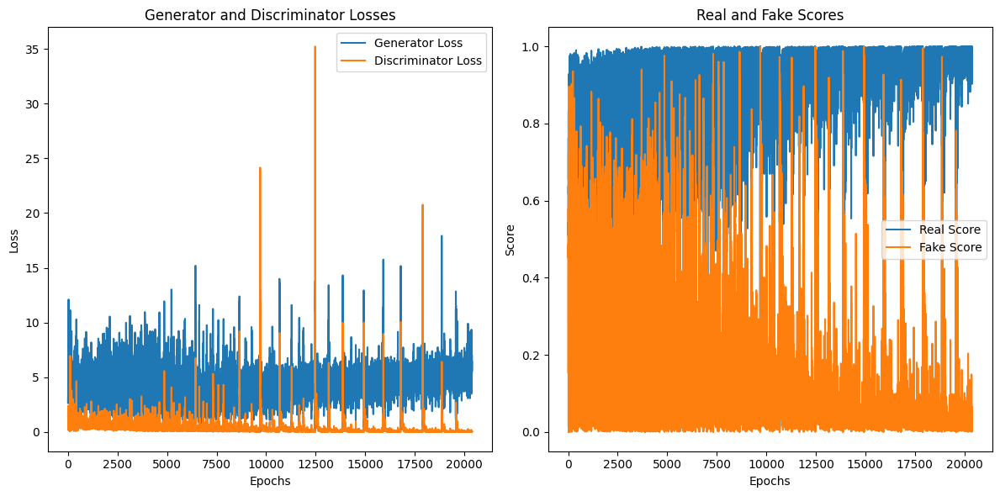

In [14]:
import matplotlib.pyplot as plt

# Function to plot training history
def plot_training_history(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, losses_g, label='Generator Loss')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses')
    plt.legend()

    # Plot real and fake scores
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, real_scores, label='Real Score')
    plt.plot(epochs_range, fake_scores, label='Fake Score')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history
plot_training_history(losses_g, losses_d, real_scores, fake_scores)

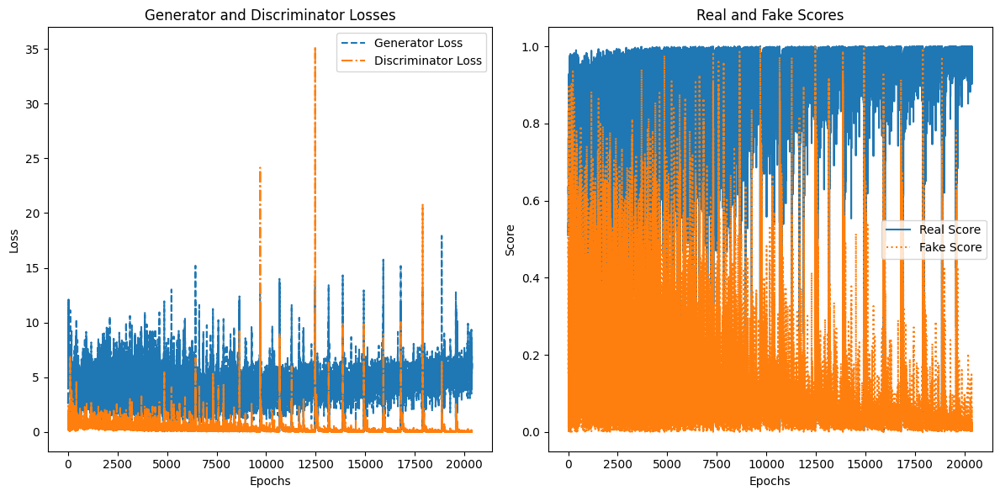

In [15]:
import matplotlib.pyplot as plt

# Function to plot training history with different line styles
def plot_training_history(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses with different line styles
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='--')  # Dashed line
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-.')  # Dash-dot line
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses')
    plt.legend()

    # Plot real and fake scores with different line styles
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, real_scores, label='Real Score', linestyle='-')  # Solid line
    plt.plot(epochs_range, fake_scores, label='Fake Score', linestyle=':')  # Dotted line
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history with customized line styles
plot_training_history(losses_g, losses_d, real_scores, fake_scores)


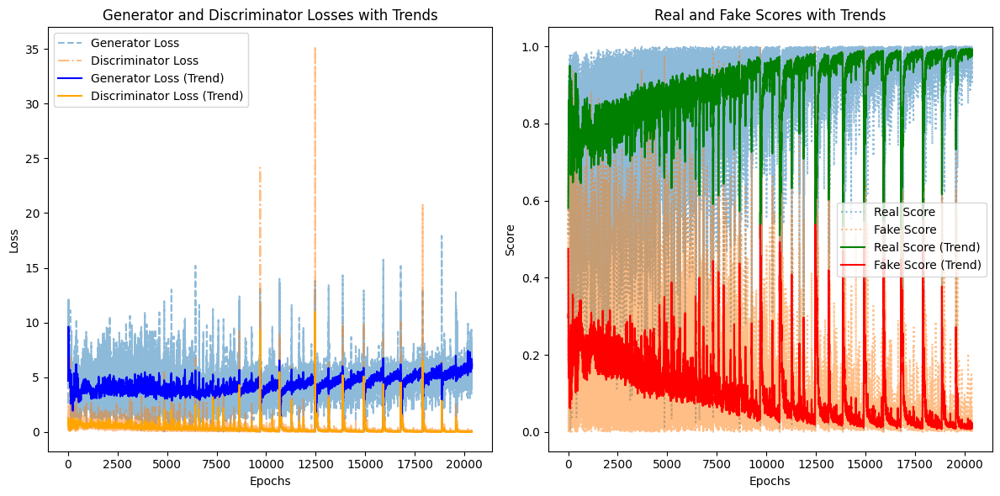

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

# Function to plot training history with trend lines
def plot_training_history(losses_g, losses_d, real_scores, fake_scores, window_size=10):
    epochs_range = range(len(losses_g))

    # Calculate moving averages for trend lines
    ma_losses_g = moving_average(losses_g, window_size)
    ma_losses_d = moving_average(losses_d, window_size)
    ma_real_scores = moving_average(real_scores, window_size)
    ma_fake_scores = moving_average(fake_scores, window_size)

    # Adjust epochs range for moving average
    ma_epochs_range = range(len(ma_losses_g))

    # Plot generator and discriminator losses with trend lines
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='--', alpha=0.5)
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-.', alpha=0.5)
    plt.plot(ma_epochs_range, ma_losses_g, label='Generator Loss (Trend)', linestyle='-', color='blue')
    plt.plot(ma_epochs_range, ma_losses_d, label='Discriminator Loss (Trend)', linestyle='-', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses with Trends')
    plt.legend()

    # Plot real and fake scores with trend lines
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, real_scores, label='Real Score', linestyle=':', alpha=0.5)
    plt.plot(epochs_range, fake_scores, label='Fake Score', linestyle=':', alpha=0.5)
    plt.plot(ma_epochs_range, ma_real_scores, label='Real Score (Trend)', linestyle='-', color='green')
    plt.plot(ma_epochs_range, ma_fake_scores, label='Fake Score (Trend)', linestyle='-', color='red')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores with Trends')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history with trend lines
plot_training_history(losses_g, losses_d, real_scores, fake_scores)


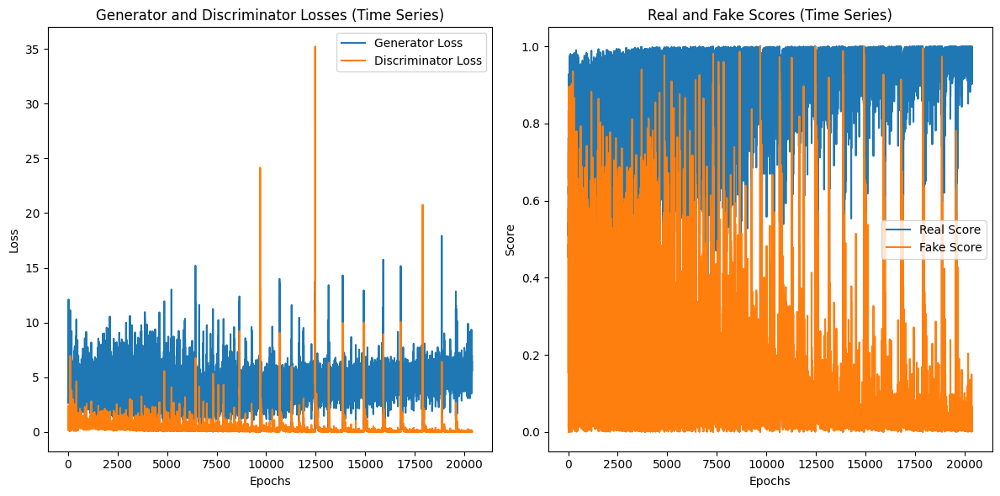

In [17]:
import matplotlib.pyplot as plt

# Function to plot training history as a time series
def plot_time_series(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses as time series
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='-')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses (Time Series)')
    plt.legend()

    # Plot real and fake scores as time series
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, real_scores, label='Real Score', linestyle='-')
    plt.plot(epochs_range, fake_scores, label='Fake Score', linestyle='-')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores (Time Series)')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history as time series
plot_time_series(losses_g, losses_d, real_scores, fake_scores)


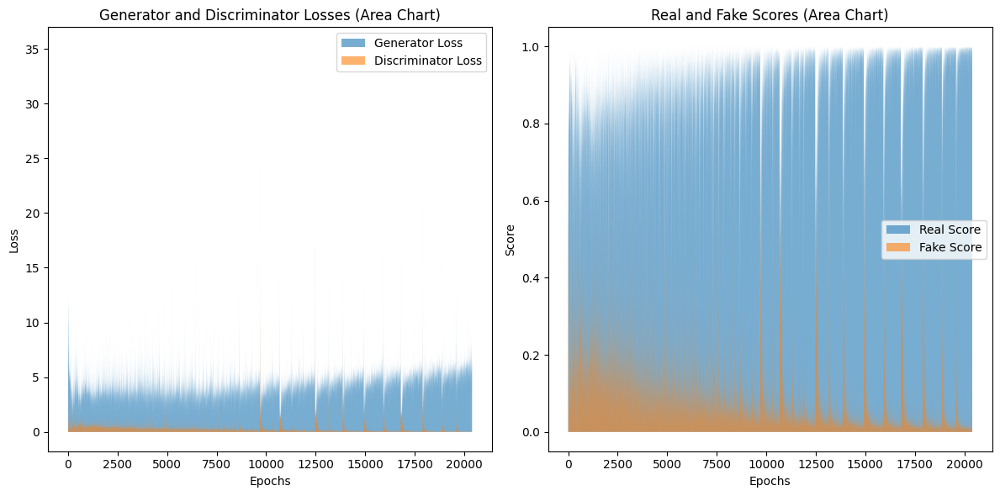

In [18]:
import matplotlib.pyplot as plt

# Function to plot training history as area charts
def plot_area_chart(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses as area charts
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.fill_between(epochs_range, losses_g, label='Generator Loss', alpha=0.6)
    plt.fill_between(epochs_range, losses_d, label='Discriminator Loss', alpha=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses (Area Chart)')
    plt.legend()

    # Plot real and fake scores as area charts
    plt.subplot(1, 2, 2)
    plt.fill_between(epochs_range, real_scores, label='Real Score', alpha=0.6)
    plt.fill_between(epochs_range, fake_scores, label='Fake Score', alpha=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores (Area Chart)')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history as area charts
plot_area_chart(losses_g, losses_d, real_scores, fake_scores)


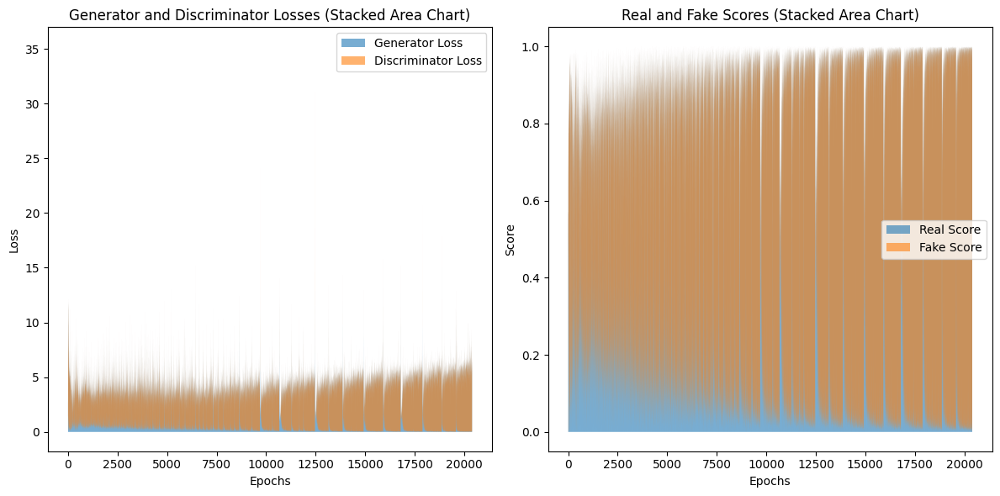

In [19]:
import matplotlib.pyplot as plt

# Function to plot training history as stacked area charts
def plot_stacked_area_chart(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot stacked area chart for generator and discriminator losses
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.fill_between(epochs_range, losses_g, label='Generator Loss', alpha=0.6)
    plt.fill_between(epochs_range, losses_g, losses_d, label='Discriminator Loss', alpha=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses (Stacked Area Chart)')
    plt.legend()

    # Plot stacked area chart for real and fake scores
    plt.subplot(1, 2, 2)
    plt.fill_between(epochs_range, real_scores, label='Real Score', alpha=0.6)
    plt.fill_between(epochs_range, real_scores, fake_scores, label='Fake Score', alpha=0.6)
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores (Stacked Area Chart)')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history as stacked area charts
plot_stacked_area_chart(losses_g, losses_d, real_scores, fake_scores)


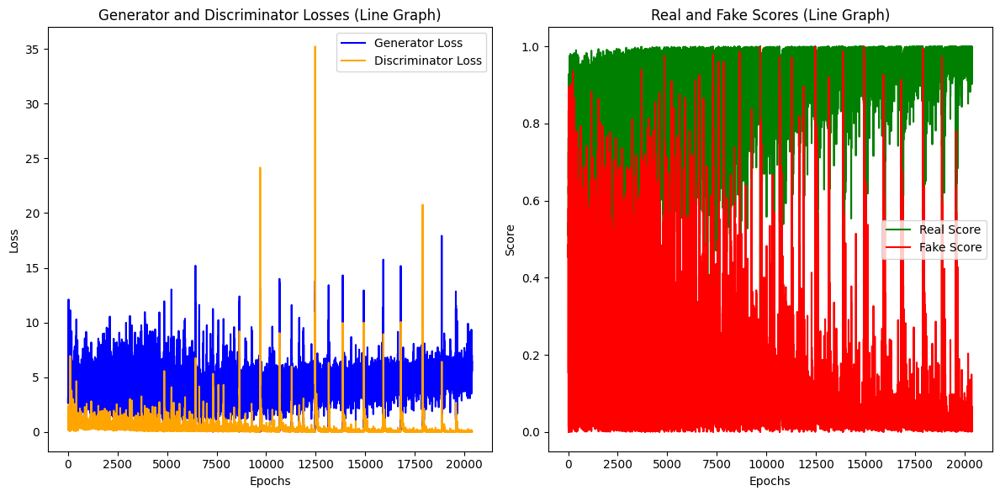

In [20]:
import matplotlib.pyplot as plt

# Function to plot training history as line graphs
def plot_line_graph(losses_g, losses_d, real_scores, fake_scores):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses as line graphs
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='-', color='blue')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Generator and Discriminator Losses (Line Graph)')
    plt.legend()

    # Plot real and fake scores as line graphs
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, real_scores, label='Real Score', linestyle='-', color='green')
    plt.plot(epochs_range, fake_scores, label='Fake Score', linestyle='-', color='red')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Real and Fake Scores (Line Graph)')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history as line graphs
plot_line_graph(losses_g, losses_d, real_scores, fake_scores)


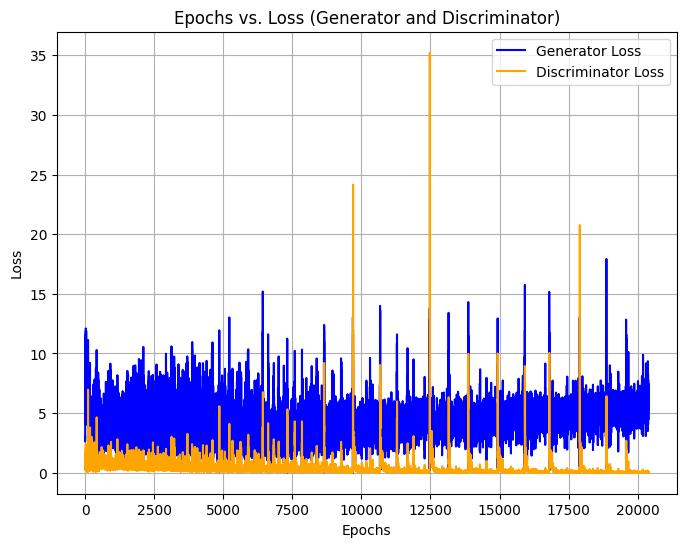

In [21]:
import matplotlib.pyplot as plt

# Function to plot epochs vs. loss for generator and discriminator
def plot_epochs_vs_loss(losses_g, losses_d):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses
    plt.figure(figsize=(8, 6))
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='-', color='blue')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Epochs vs. Loss (Generator and Discriminator)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot epochs vs. loss
plot_epochs_vs_loss(losses_g, losses_d)


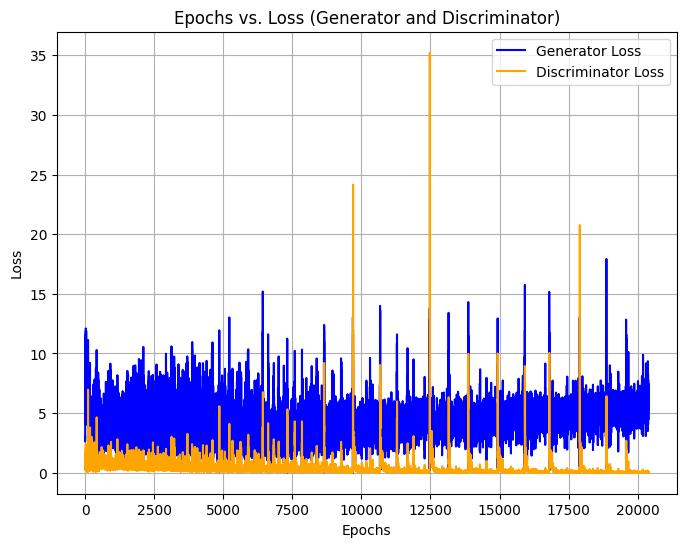

In [22]:
import matplotlib.pyplot as plt

# Function to plot epochs vs. loss as a line graph
def plot_epochs_vs_loss_line_graph(losses_g, losses_d):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses as line graphs
    plt.figure(figsize=(8, 6))
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='-', color='blue')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Epochs vs. Loss (Generator and Discriminator)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot epochs vs. loss as a line graph
plot_epochs_vs_loss_line_graph(losses_g, losses_d)


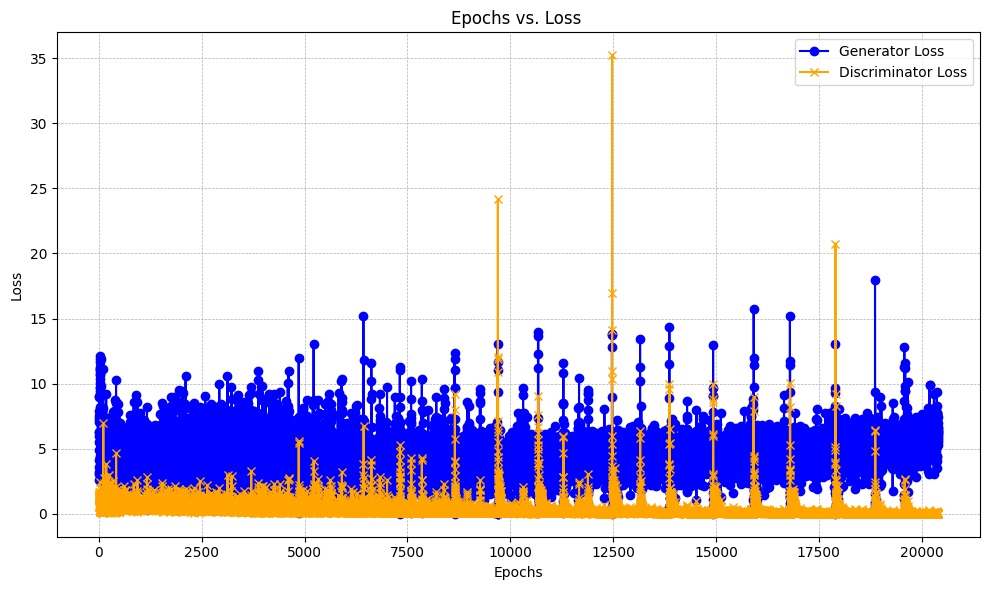

In [23]:
import matplotlib.pyplot as plt

# Function to plot epochs vs. loss like a stock market graph
def plot_stock_market_style(losses_g, losses_d):
    epochs_range = range(len(losses_g))

    # Plot generator and discriminator losses with markers and grid
    plt.figure(figsize=(10, 6))
    plt.plot(epochs_range, losses_g, label='Generator Loss', linestyle='-', marker='o', color='blue')
    plt.plot(epochs_range, losses_d, label='Discriminator Loss', linestyle='-', marker='x', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Epochs vs. Loss ')
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Plot epochs vs. loss with a stock market style
plot_stock_market_style(losses_g, losses_d)


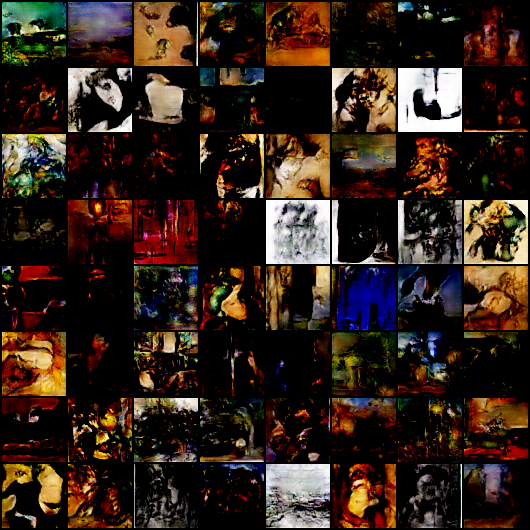

In [24]:
from IPython.display import Image
Image('./generated/generated-images-0151.png')

In [25]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

# Load the model checkpoints
generator = nn.Sequential(
    # Define layers...
)
generator.load_state_dict(torch.load('G.pth', map_location=device))
generator.eval()

discriminator = nn.Sequential(
    # Define layers...
)
discriminator.load_state_dict(torch.load('D.pth', map_location=device))
discriminator.eval()


<ipython-input-25-597496153ff9>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('G.pth', map_location=device))


RuntimeError: Error(s) in loading state_dict for Sequential:
	Unexpected key(s) in state_dict: "0.weight", "1.weight", "1.bias", "1.running_mean", "1.running_var", "1.num_batches_tracked", "3.weight", "4.weight", "4.bias", "4.running_mean", "4.running_var", "4.num_batches_tracked", "6.weight", "7.weight", "7.bias", "7.running_mean", "7.running_var", "7.num_batches_tracked", "9.weight", "10.weight", "10.bias", "10.running_mean", "10.running_var", "10.num_batches_tracked", "12.weight". 

In [26]:
import shutil

# Path to the "generated" folder
folder_path = '/content/generated'

# Path where the zip file will be saved
zip_file_path = '/content/generated.zip'

# Creating a zip file from the folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

zip_file_path


'/content/generated.zip'

In [27]:
# Assuming train_dl is your DataLoader (for training data)
for real_images, _ in train_dl:
    print("Shape of the data batch:", real_images.shape)
    break  # Just print the shape for the first batch


Shape of the data batch: torch.Size([128, 3, 64, 64])


In [28]:
!pip show torch


Name: torch
Version: 2.5.1+cu121
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3-Clause
Location: /usr/local/lib/python3.10/dist-packages
Requires: filelock, fsspec, jinja2, networkx, sympy, typing-extensions
Required-by: accelerate, fastai, peft, sentence-transformers, timm, torchaudio, torchvision


In [29]:
import tkinter as tk
from tkinter import filedialog
from tkinter import messagebox
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image, ImageTk
import numpy as np

# Define the Generator and Discriminator based on the provided architecture
latent_size = 128

generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten(),
    nn.Sigmoid()
)

# Assuming the device is CUDA (GPU), else change to CPU if needed
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load models (update the paths to your models)
generator.load_state_dict(torch.load("G.pth"))
discriminator.load_state_dict(torch.load("D.pth"))
generator.to(device)
discriminator.to(device)
generator.eval()
discriminator.eval()

# Tkinter GUI for generating and uploading images
class ArtGeneratorApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Art Generator")

        # Canvas for displaying the image
        self.canvas = tk.Canvas(root, width=256, height=256)
        self.canvas.pack()

        # Button to generate new art
        self.generate_button = tk.Button(root, text="Generate Art", command=self.generate_art)
        self.generate_button.pack()

        # Button to upload an art image
        self.upload_button = tk.Button(root, text="Upload Image", command=self.upload_image)
        self.upload_button.pack()

    def generate_art(self):
        # Generate random latent vector z
        z = torch.randn(1, latent_size, 1, 1).to(device)

        # Generate an image using the generator
        with torch.no_grad():
            generated_image = generator(z).cpu().squeeze().permute(1, 2, 0).numpy()
            generated_image = np.clip(generated_image * 255, 0, 255).astype(np.uint8)

        # Convert the generated image to Tkinter-compatible format
        img = Image.fromarray(generated_image)
        img = ImageTk.PhotoImage(img)

        # Display the generated image on the canvas
        self.canvas.create_image(128, 128, image=img)
        self.canvas.image = img

    def upload_image(self):
        # Ask the user to upload an image
        file_path = filedialog.askopenfilename()
        if file_path:
            # Open and display the image
            uploaded_image = Image.open(file_path).resize((256, 256))
            uploaded_image = ImageTk.PhotoImage(uploaded_image)

            # Display the uploaded image on the canvas
            self.canvas.create_image(128, 128, image=uploaded_image)
            self.canvas.image = uploaded_image

# Create the Tkinter root window and run the app
root = tk.Tk()
app = ArtGeneratorApp(root)
root.mainloop()


<ipython-input-29-7c49ff8e0f59>:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load("G.pth"))
<ipython-input-29-7c49ff8e0f59>:53: FutureWa

TclError: no display name and no $DISPLAY environment variable

In [ ]:
import tkinter as tk
from tkinter import filedialog
from tkinter import messagebox
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image, ImageTk
import numpy as np

# Define the Generator and Discriminator based on the provided architecture
latent_size = 128

generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten(),
    nn.Sigmoid()
)

# Assuming the device is CUDA (GPU), else change to CPU if needed
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load models (update the paths to your models)
generator.load_state_dict(torch.load("G.pth"))
discriminator.load_state_dict(torch.load("D.pth"))
generator.to(device)
discriminator.to(device)
generator.eval()
discriminator.eval()

# Tkinter GUI for generating and uploading images
class ArtGeneratorApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Art Generator")

        # Canvas for displaying the image
        self.canvas = tk.Canvas(root, width=256, height=256)
        self.canvas.pack()

        # Entry to specify number of artworks to generate
        self.num_artworks_label = tk.Label(root, text="Enter number of artworks to generate:")
        self.num_artworks_label.pack()

        self.num_artworks_entry = tk.Entry(root)
        self.num_artworks_entry.pack()

        # Button to generate new art
        self.generate_button = tk.Button(root, text="Generate Art", command=self.generate_art)
        self.generate_button.pack()

        # Button to upload an art image
        self.upload_button = tk.Button(root, text="Upload Image", command=self.upload_image)
        self.upload_button.pack()

    def generate_art(self):
        # Get the number of artworks from the input field
        try:
            num_artworks = int(self.num_artworks_entry.get())
            if num_artworks <= 0:
                raise ValueError("Please enter a positive integer.")
        except ValueError as e:
            messagebox.showerror("Input Error", str(e))
            return

        # Generate the specified number of artworks
        for i in range(num_artworks):
            # Generate random latent vector z
            z = torch.randn(1, latent_size, 1, 1).to(device)

            # Generate an image using the generator
            with torch.no_grad():
                generated_image = generator(z).cpu().squeeze().permute(1, 2, 0).numpy()
                generated_image = np.clip(generated_image * 255, 0, 255).astype(np.uint8)

            # Convert the generated image to Tkinter-compatible format
            img = Image.fromarray(generated_image)
            img = ImageTk.PhotoImage(img)

            # Display the generated image on the canvas
            self.canvas.create_image(128, 128, image=img)
            self.canvas.image = img

    def upload_image(self):
        # Ask the user to upload an image
        file_path = filedialog.askopenfilename()
        if file_path:
            # Open and display the image
            uploaded_image = Image.open(file_path).resize((256, 256))
            uploaded_image = ImageTk.PhotoImage(uploaded_image)

            # Display the uploaded image on the canvas
            self.canvas.create_image(128, 128, image=uploaded_image)
            self.canvas.image = uploaded_image

# Create the Tkinter root window and run the app
root = tk.Tk()
app = ArtGeneratorApp(root)
root.mainloop()
